# Trajectory Analysis

## PAGA

Partition-based graph abstraction (PAGA), is an algorithm which provides an interpretable graph-like map of the arising data manifold, based on estimating connectivity of manifold partitions [[Wolf19](https://genomebiology.biomedcentral.com/articles/10.1186/s13059-019-1663-x#citeas)].

Before running `PAGA`, we need to create a group of cluster results and a neigbobor pairwise matrix. Here we use mouse embryo data for demo. Download the [example data](http://116.6.21.110:8090/share/c5d9e7f3-7d66-4154-87e1-a740f4bb4dbc) first.

In [1]:
import stereo as st
import warnings
warnings.filterwarnings('ignore')

# read data
data = st.io.read_h5ad('../data/Embyro/Embyro_E9.5.h5ad')

# preprocessing
data.tl.cal_qc()
data.tl.raw_checkpoint()
data.tl.normalize_total(target_sum=1e4)
data.tl.log1p()

# hvg
data.tl.highly_variable_genes(min_mean=0.0125, max_mean=3, min_disp=0.5, res_key='highly_variable_genes', n_top_genes=None)

data.tl.scale(zero_center=False)

# embedding
data.tl.pca(use_highly_genes=True, hvg_res_key='highly_variable_genes', n_pcs=20, res_key='pca', svd_solver='arpack')
data.tl.neighbors(pca_res_key='pca', n_pcs=30, res_key='neighbors', n_jobs=-1)
data.tl.umap(pca_res_key='pca', neighbors_res_key='neighbors', res_key='umap')

[2024-04-07 17:41:26][Stereo][42395][MainThread][140284015499072][st_pipeline][41][INFO]: start to run cal_qc...
[2024-04-07 17:41:26][Stereo][42395][MainThread][140284015499072][st_pipeline][44][INFO]: cal_qc end, consume time 0.2455s.
[2024-04-07 17:41:27][Stereo][42395][MainThread][140284015499072][st_pipeline][41][INFO]: start to run normalize_total...
[2024-04-07 17:41:27][Stereo][42395][MainThread][140284015499072][st_pipeline][44][INFO]: normalize_total end, consume time 0.2725s.
[2024-04-07 17:41:27][Stereo][42395][MainThread][140284015499072][st_pipeline][41][INFO]: start to run log1p...
[2024-04-07 17:41:27][Stereo][42395][MainThread][140284015499072][st_pipeline][44][INFO]: log1p end, consume time 0.1476s.
[2024-04-07 17:41:27][Stereo][42395][MainThread][140284015499072][st_pipeline][41][INFO]: start to run highly_variable_genes...
[2024-04-07 17:41:27][Stereo][42395][MainThread][140284015499072][st_pipeline][44][INFO]: highly_variable_genes end, consume time 0.3330s.
[2024-

	completed  0  /  500 epochs
	completed  50  /  500 epochs
	completed  100  /  500 epochs
	completed  150  /  500 epochs
	completed  200  /  500 epochs
	completed  250  /  500 epochs
	completed  300  /  500 epochs
	completed  350  /  500 epochs
	completed  400  /  500 epochs
	completed  450  /  500 epochs


[2024-04-07 17:41:44][Stereo][42395][MainThread][140284015499072][st_pipeline][44][INFO]: umap end, consume time 10.6142s.


In [2]:
data.tl.paga(groups='annotation', neighbors_key='neighbors')

[2024-04-07 17:41:44][Stereo][42395][MainThread][140284015499072][st_pipeline][77][INFO]: register algorithm paga to <stereo.core.st_pipeline.AnnBasedStPipeline object at 0x7f965c1e81f0>


We could obtain `connectivities` and `connectivities_tree` in the result of PAGA. `connectivities_tree` indicates cluster-to-cluster relation.

In [3]:
data.tl.result['paga']

{'connectivities': <12x12 sparse matrix of type '<class 'numpy.float64'>'
 	with 90 stored elements in Compressed Sparse Row format>,
 'connectivities_tree': <12x12 sparse matrix of type '<class 'numpy.float64'>'
 	with 11 stored elements in Compressed Sparse Row format>,
 'annotation_sizes': array([ 452, 1518,  200,  882,  283,  273,  382,   98,  337, 1008,  236,
         244]),
 'groups': 'annotation'}

## Visualization for PAGA

[2024-04-07 17:41:44][Stereo][42395][MainThread][140284015499072][plot_collection][84][INFO]: register plot_func paga_plot to <stereo.plots.plot_collection.PlotCollection object at 0x7f960dbd6550>


Column
    [0] Markdown(str)
    [1] Row
        [0] TextInput(name='file name', placeholder='Enter a file name...', width=200)
        [1] Select(name='file format', options=['png', 'pdf'], value='png', width=60)
        [2] IntInput(name='dpi', placeholder='Enter the dip...', start=0, value=100, width=200)
    [2] Row
        [0] Button(button_type='primary', name='export', width=100)
        [1] StaticText(width=800)

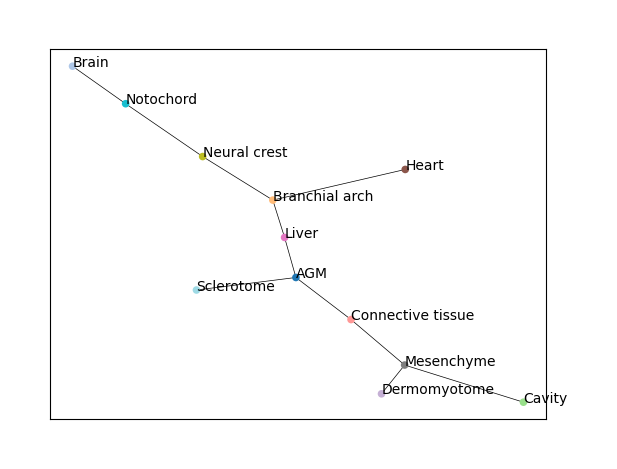

In [4]:
data.plt.paga_plot(
            adjacency='connectivities_tree', # keyword to use for paga or paga tree
            threshold=0.01, # prune edges lower than threshold
            layout='fr' # the method to layout each node
            )

<div class="alert alert-info">

**Note**

The installation of the officially provided package fa2 which is necessary for ` layout='fa' ` is abnormal. In order to solve this problem, we recommend using our modified package for installation. the differences between the package we provide and the official package [ [url](https://github.com/STOmics/Stereopy/discussions/258) ].
* The first step is to [download](https://github.com/STOmics/Stereopy/discussions/258) the installation package and unzip it.* 
The second step is to enter the directory where the decompressed file is located and use ` python setup.py install `.


</div>

[2024-04-07 17:41:44][Stereo][42395][MainThread][140284015499072][plot_collection][84][INFO]: register plot_func draw_graph to <stereo.plots.plot_collection.PlotCollection object at 0x7f960dbd6550>


Column
    [0] Markdown(str)
    [1] Row
        [0] TextInput(name='file name', placeholder='Enter a file name...', width=200)
        [1] Select(name='file format', options=['png', 'pdf'], value='png', width=60)
        [2] IntInput(name='dpi', placeholder='Enter the dip...', start=0, value=100, width=200)
    [2] Row
        [0] Button(button_type='primary', name='export', width=100)
        [1] StaticText(width=800)

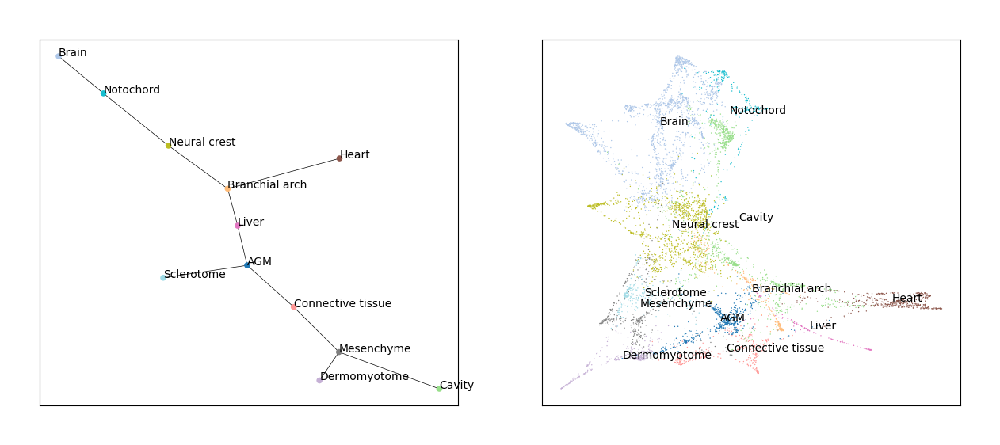

In [5]:
data.plt.draw_graph(
        adjacency='connectivities_tree',
        threshold=0.01,
        layout='fa'
        )

[2024-04-07 17:49:37][Stereo][42395][MainThread][140284015499072][plot_collection][84][INFO]: register plot_func paga_compare to <stereo.plots.plot_collection.PlotCollection object at 0x7f960dbd6550>


Column
    [0] Markdown(str)
    [1] Row
        [0] TextInput(name='file name', placeholder='Enter a file name...', width=200)
        [1] Select(name='file format', options=['png', 'pdf'], value='png', width=60)
        [2] IntInput(name='dpi', placeholder='Enter the dip...', start=0, value=100, width=200)
    [2] Row
        [0] Button(button_type='primary', name='export', width=100)
        [1] StaticText(width=800)

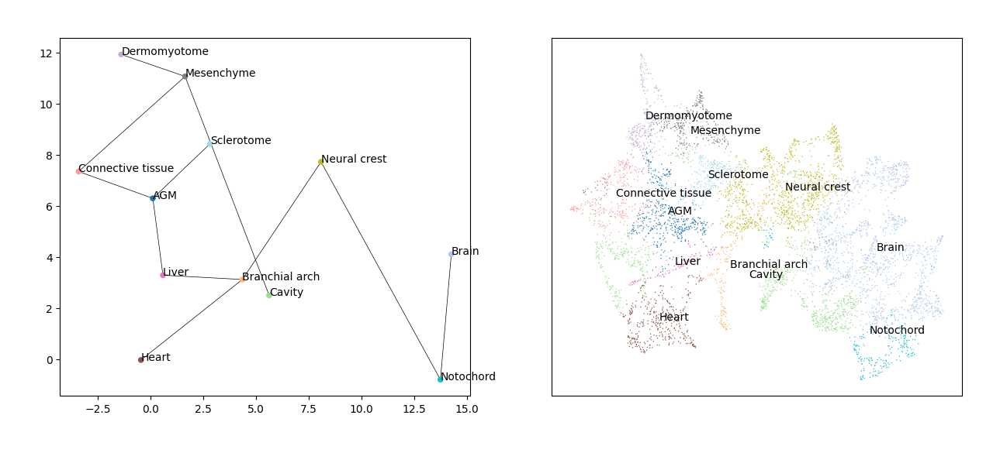

In [6]:
data.plt.paga_compare(
        adjacency='connectivities_tree',
        threshold=0.01
        )

Column
    [0] Markdown(str)
    [1] Row
        [0] TextInput(name='file name', placeholder='Enter a file name...', width=200)
        [1] Select(name='file format', options=['png', 'pdf'], value='png', width=60)
        [2] IntInput(name='dpi', placeholder='Enter the dip...', start=0, value=100, width=200)
    [2] Row
        [0] Button(button_type='primary', name='export', width=100)
        [1] StaticText(width=800)

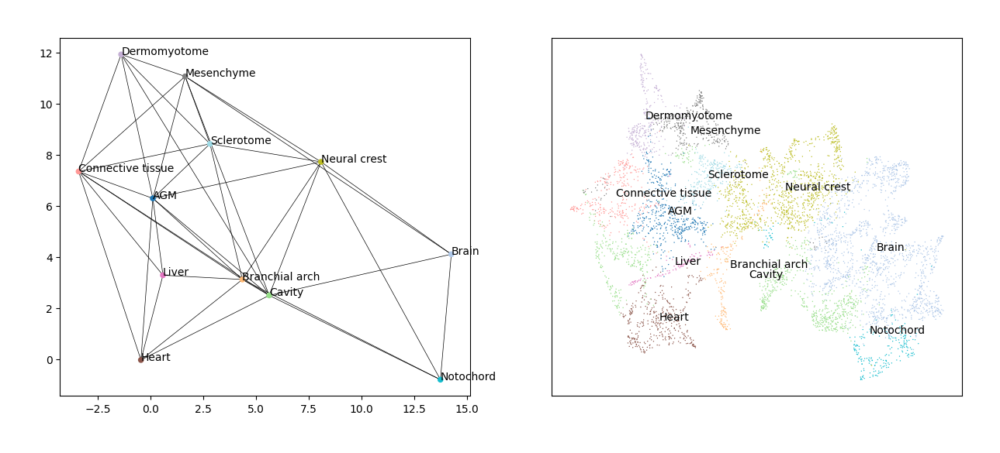

In [7]:
data.plt.paga_compare(
        adjacency='connectivities',
        threshold=0.01
        )

## Cluster trajectory

Plot the cluster trajectory described by the result of PAGA.

[2024-04-07 17:49:38][Stereo][42395][MainThread][140284015499072][plot_collection][84][INFO]: register plot_func plot_cluster_traj to <stereo.plots.plot_collection.PlotCollection object at 0x7f960dbd6550>


Column
    [0] Markdown(str)
    [1] Row
        [0] TextInput(name='file name', placeholder='Enter a file name...', width=200)
        [1] Select(name='file format', options=['png', 'pdf'], value='png', width=60)
        [2] IntInput(name='dpi', placeholder='Enter the dip...', start=0, value=100, width=200)
    [2] Row
        [0] Button(button_type='primary', name='export', width=100)
        [1] StaticText(width=800)

<Figure size 6400x4800 with 0 Axes>

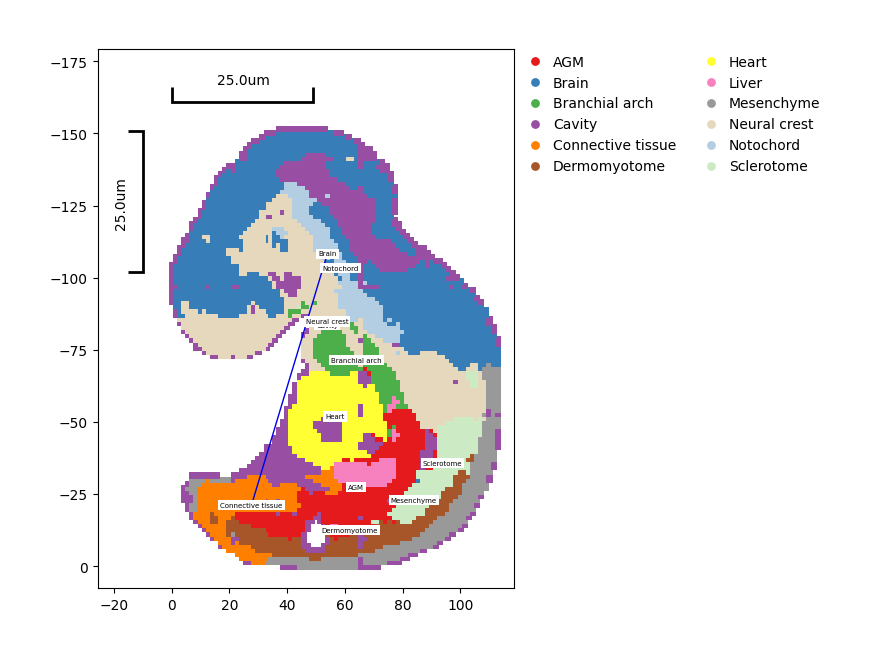

In [8]:
x_raw = data.position[:, 0]
y_raw = data.position[:, 1]

data.plt.plot_cluster_traj(
        data.tl.result['paga']['connectivities_tree'].todense(), 
        x_raw,
        y_raw,
        data.cells['annotation'].to_numpy(), 
        lower_thresh_not_equal=0.95, 
        count_thresh=100, 
        eps_co=30, 
        check_surr_co=20,
        show_ticks=True,
        type_traj="straight",
        plotting_scale_width=50,
        )

## DPT

The chronology of differentiated cells is essentially implicit in their single-cell expression products. Diffusion pseudotime (DPT) is an efficient way to estimate this order, which uses diffusion-like random walks to measure cell-to-cell metastasis [[Haghverdi16](https://pubmed.ncbi.nlm.nih.gov/27571553/)]. DPT method enables the reconstruction of cellular development, identifying transient or metastable states, branching decisions, and differentiation endpoints.

As an example, we choose the 100th  Spinal cord cell as the root cell.

In [9]:
import numpy as np

# setting the `iroot` to data.tl.result
data.tl.result['iroot'] = np.flatnonzero(data.cells['annotation'] == 'Cavity')[100]  # 'Heart'
data.tl.dpt(n_branchings=0)

[2024-04-07 17:49:39][Stereo][42395][MainThread][140284015499072][st_pipeline][77][INFO]: register algorithm dpt to <stereo.core.st_pipeline.AnnBasedStPipeline object at 0x7f965c1e81f0>
[2024-04-07 17:49:39][Stereo][42395][MainThread][140284015499072][main][989][WARNING]: Trying to run `tl.dpt` without prior call of `tl.diffmap`. Falling back to `tl.diffmap` with default parameters.
[2024-04-07 17:49:39][Stereo][42395][MainThread][140284015499072][main][21][INFO]: computing Diffusion Maps using n_comps=15(=n_dcs)
[2024-04-07 17:49:39][Stereo][42395][MainThread][140284015499072][struct][732][INFO]: finished
[2024-04-07 17:49:40][Stereo][42395][MainThread][140284015499072][struct][793][INFO]:     eigenvalues of transition matrix
    [1.         0.9968214  0.9944742  0.99249655 0.991394   0.99011517
     0.98855114 0.9875123  0.9872849  0.9851326  0.98486674 0.983596
     0.98220223 0.980026   0.97919136]
[2024-04-07 17:49:40][Stereo][42395][MainThread][140284015499072][main][27][INFO]:  

## Vector plot 

The stream-mode (set parameter `type`  as `stream`) describes dpt as streams that flow from lower pseudotime to higher pseudotime. Background shows distribution of cell types or clusters, and it can take forms of either observations (set 'background' as 'scatter') or pixels (set 'background' as 'field'). 

We could also use the result to complete stream-mode plot.

[2024-04-07 17:49:40][Stereo][42395][MainThread][140284015499072][plot_collection][84][INFO]: register plot_func plot_vec to <stereo.plots.plot_collection.PlotCollection object at 0x7f960dbd6550>


Column
    [0] Markdown(str)
    [1] Row
        [0] TextInput(name='file name', placeholder='Enter a file name...', width=200)
        [1] Select(name='file format', options=['png', 'pdf'], value='png', width=60)
        [2] IntInput(name='dpi', placeholder='Enter the dip...', start=0, value=100, width=200)
    [2] Row
        [0] Button(button_type='primary', name='export', width=100)
        [1] StaticText(width=800)

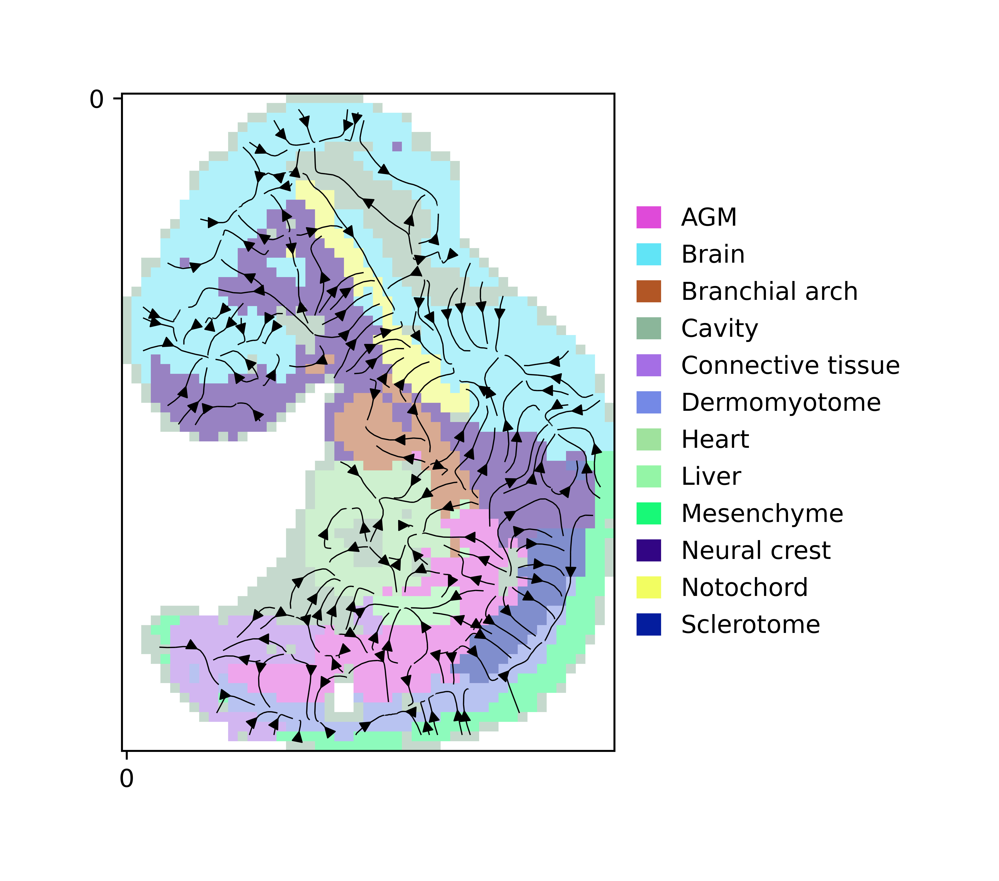

In [10]:
data.plt.plot_vec(
        data.position[:, 0] - data.position[:, 0].min(),
        data.position[:, 1] - data.position[:, 1].min(),
        data.cells['annotation'].to_numpy(),
        data.tl.result['dpt_pseudotime'],
        type='stream',
        line_width=0.5,
        background='field',
        num_pix=50, 
        filter_type='gauss',
        sigma_val=1,
        radius_val=3,
        density=2,
        seed_val=0,
        num_legend_per_col=20,
        dpi_val=1000
        )

Column
    [0] Markdown(str)
    [1] Row
        [0] TextInput(name='file name', placeholder='Enter a file name...', width=200)
        [1] Select(name='file format', options=['png', 'pdf'], value='png', width=60)
        [2] IntInput(name='dpi', placeholder='Enter the dip...', start=0, value=100, width=200)
    [2] Row
        [0] Button(button_type='primary', name='export', width=100)
        [1] StaticText(width=800)

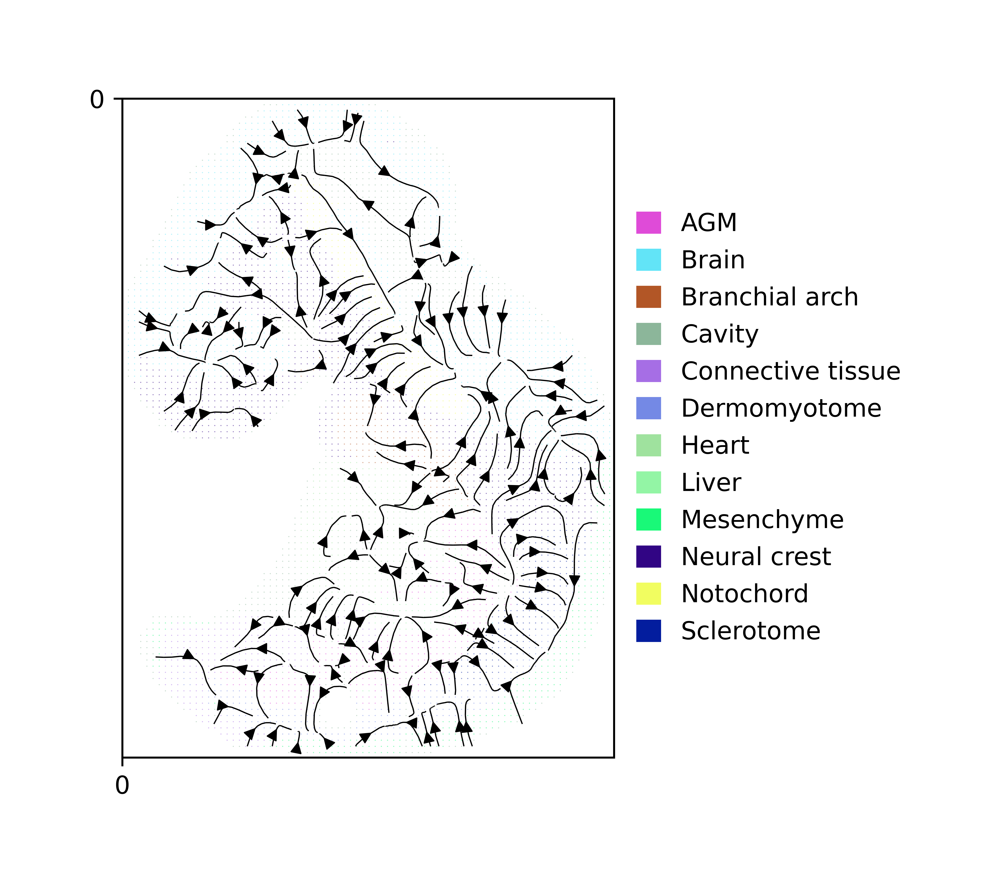

In [11]:
data.plt.plot_vec(
        data.position[:, 0] - data.position[:, 0].min(),
        data.position[:, 1] - data.position[:, 1].min(),
        data.cells['annotation'].to_numpy(),
        data.tl.result['dpt_pseudotime'],
        type='stream',
        line_width=0.5,
        background='scatter',
        num_pix=50, 
        filter_type='gauss',
        sigma_val=1,
        radius_val=3,
        scatter_s=0.2,
        density=2,
        seed_val=0,
        num_legend_per_col=20,
        dpi_val=1000
        )

We could also use the result to complete vector-mode plot.

Column
    [0] Markdown(str)
    [1] Row
        [0] TextInput(name='file name', placeholder='Enter a file name...', width=200)
        [1] Select(name='file format', options=['png', 'pdf'], value='png', width=60)
        [2] IntInput(name='dpi', placeholder='Enter the dip...', start=0, value=100, width=200)
    [2] Row
        [0] Button(button_type='primary', name='export', width=100)
        [1] StaticText(width=800)

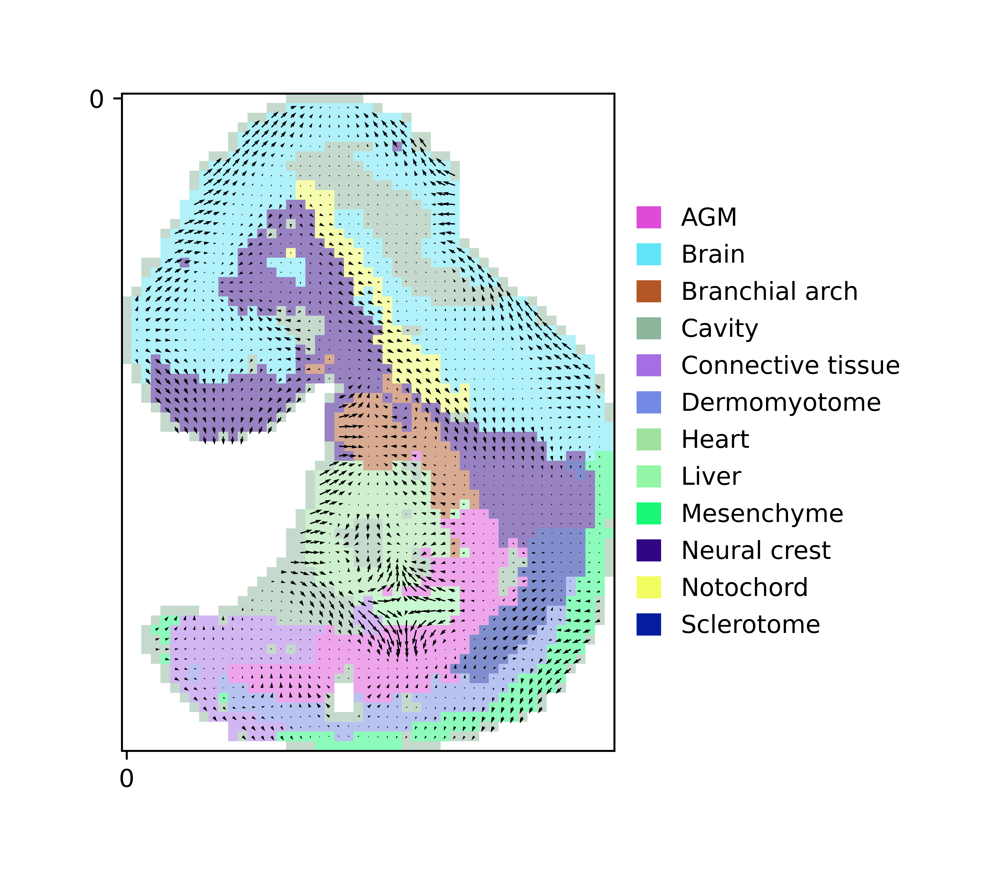

In [12]:
data.plt.plot_vec(
        data.position[:, 0] - data.position[:, 0].min(),
        data.position[:, 1] - data.position[:, 1].min(),
        data.cells['annotation'].to_numpy(),
        data.tl.result['dpt_pseudotime'],
        type='vec',
        background='field',
        num_pix=50,
        filter_type='gauss',
        sigma_val=2,
        radius_val=1,
        seed_val=0,
        dpi_val=1000
        )

Column
    [0] Markdown(str)
    [1] Row
        [0] TextInput(name='file name', placeholder='Enter a file name...', width=200)
        [1] Select(name='file format', options=['png', 'pdf'], value='png', width=60)
        [2] IntInput(name='dpi', placeholder='Enter the dip...', start=0, value=100, width=200)
    [2] Row
        [0] Button(button_type='primary', name='export', width=100)
        [1] StaticText(width=800)

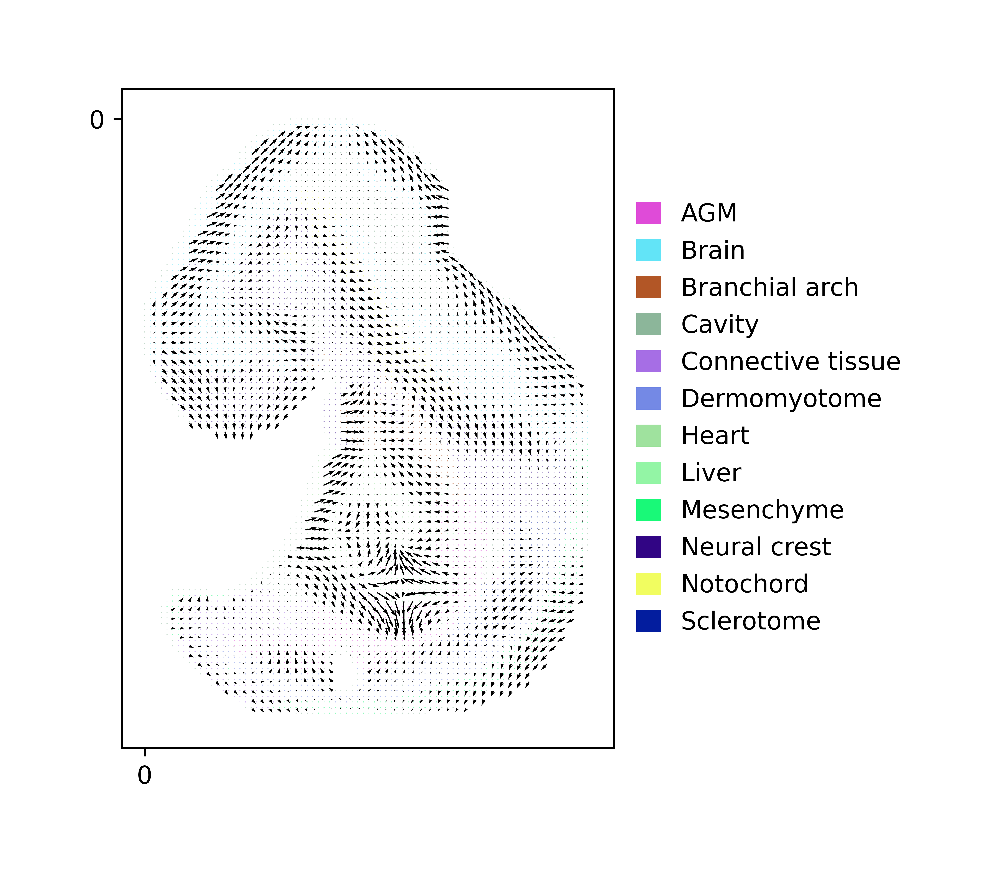

In [13]:
data.plt.plot_vec(
        data.position[:, 0] - data.position[:, 0].min(),
        data.position[:, 1] - data.position[:, 1].min(),
        data.cells['annotation'].to_numpy(),
        data.tl.result['dpt_pseudotime'],
        type='vec',
        background='scatter',
        num_pix=50,
        filter_type='gauss',
        sigma_val=2,
        radius_val=1,
        scatter_s=0.2,
        seed_val=0,
        dpi_val=1000
        )

[2024-04-07 17:49:56][Stereo][42395][MainThread][140284015499072][plot_collection][84][INFO]: register plot_func plot_time_scatter to <stereo.plots.plot_collection.PlotCollection object at 0x7f960dbd6550>


Column
    [0] Markdown(str)
    [1] Row
        [0] TextInput(name='file name', placeholder='Enter a file name...', width=200)
        [1] Select(name='file format', options=['png', 'pdf'], value='png', width=60)
        [2] IntInput(name='dpi', placeholder='Enter the dip...', start=0, value=100, width=200)
    [2] Row
        [0] Button(button_type='primary', name='export', width=100)
        [1] StaticText(width=800)

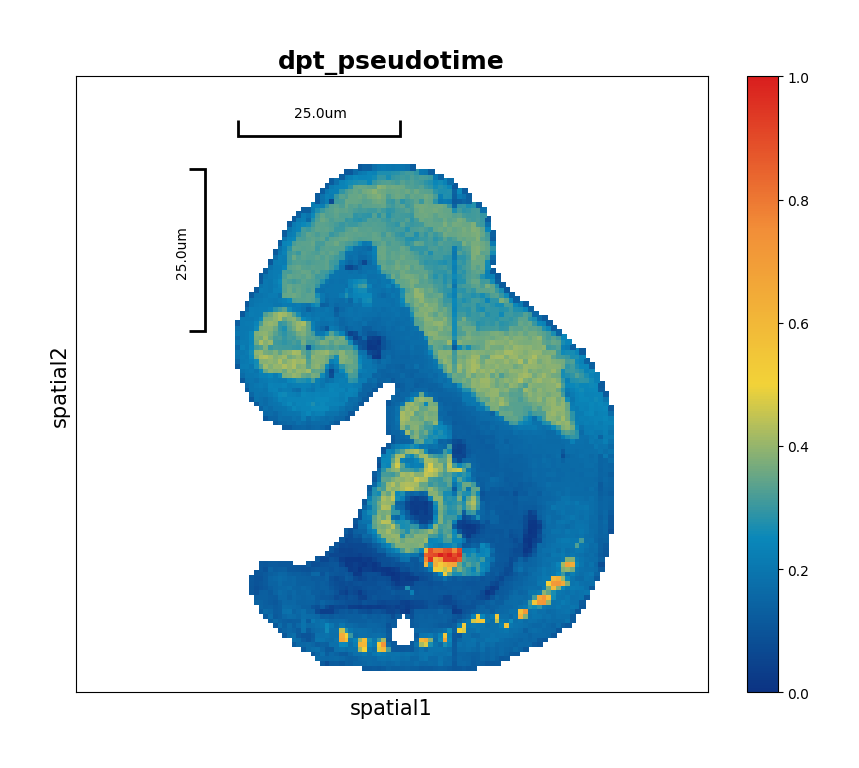

In [14]:
data.plt.plot_time_scatter(group='annotation', plotting_scale_width=50)

### Distribution of marker genes over pseudotime

In [15]:
data.tl.find_marker_genes(cluster_res_key='annotation', method='t_test', use_highly_genes=False, use_raw=True, res_key='marker_genes')

[2024-04-07 17:49:57][Stereo][42395][MainThread][140284015499072][st_pipeline][41][INFO]: start to run find_marker_genes...
[2024-04-07 17:50:00][Stereo][42395][MainThread][140284015499072][tool_base][122][INFO]: read group information, grouping by group column.
[2024-04-07 17:50:00][Stereo][42395][MainThread][140284015499072][tool_base][151][INFO]: start to run...
[2024-04-07 17:50:03][Stereo][42395][MainThread][140284015499072][tool_base][153][INFO]: end to run.
[2024-04-07 17:50:03][Stereo][42395][MainThread][140284015499072][st_pipeline][44][INFO]: find_marker_genes end, consume time 6.3101s.


[2024-04-07 17:50:03][Stereo][42395][MainThread][140284015499072][plot_collection][84][INFO]: register plot_func plot_genes_in_pseudotime to <stereo.plots.plot_collection.PlotCollection object at 0x7f960dbd6550>


Column
    [0] Markdown(str)
    [1] Row
        [0] TextInput(name='file name', placeholder='Enter a file name...', width=200)
        [1] Select(name='file format', options=['png', 'pdf'], value='png', width=60)
        [2] IntInput(name='dpi', placeholder='Enter the dip...', start=0, value=100, width=200)
    [2] Row
        [0] Button(button_type='primary', name='export', width=100)
        [1] StaticText(width=800)

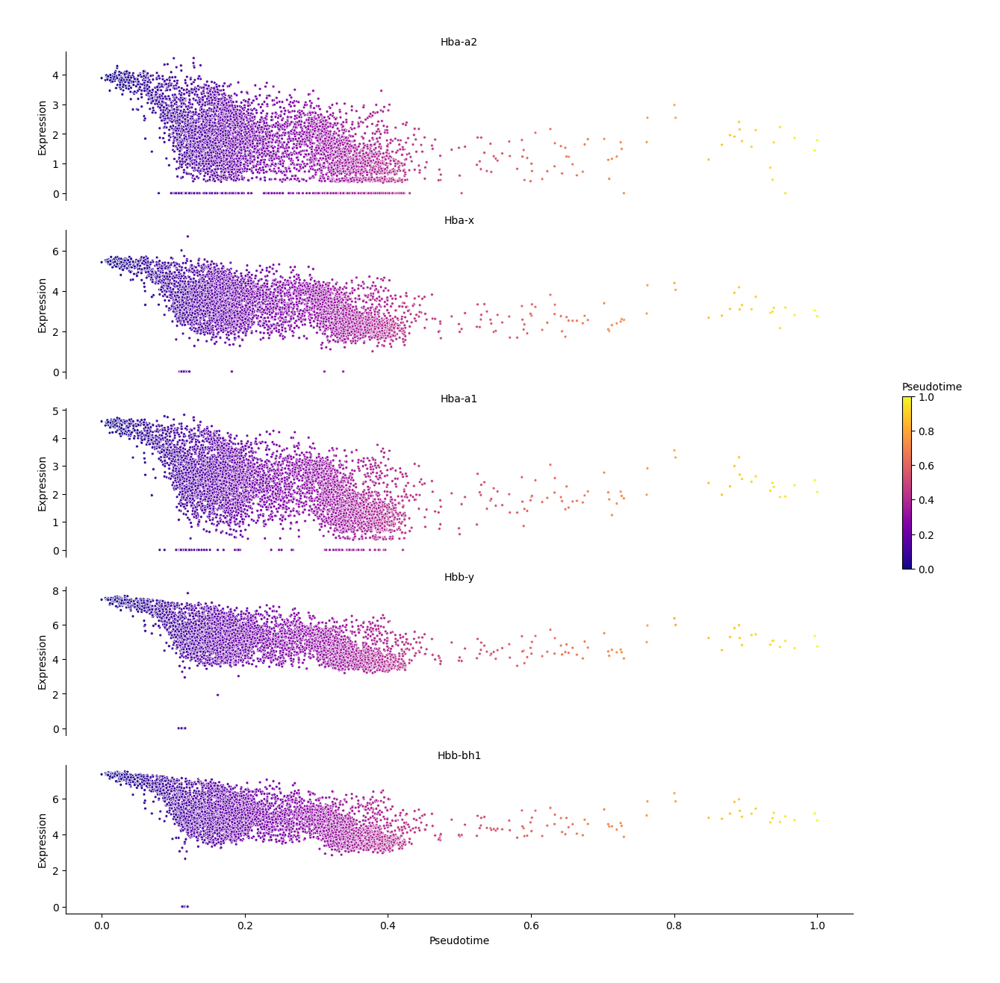

In [16]:
data.plt.plot_genes_in_pseudotime(
    marker_genes_res_key='marker_genes',
    group='Cavity',
    topn=5
)

## Temporal gene pattern for serially up & down regulated genes along trajectory

Stereopy also provideS a method to explore the genes that highly correlated to the development trajectory. The gene expression exhibits a certain pattern along the trajectory. For example, you can use ```time_series_analysis``` to find up or down-regulated genes during developmental trajectory.

In [17]:
data.tl.time_series_analysis(
        run_method='tvg_marker', 
        use_col='annotation',                      
        branch=['AGM', 'Brain', 'Branchial arch', 'Cavity'],                 
        p_val_combination='FDR'
        )

[2024-04-07 17:50:05][Stereo][42395][MainThread][140284015499072][st_pipeline][77][INFO]: register algorithm time_series_analysis to <stereo.core.st_pipeline.AnnBasedStPipeline object at 0x7f965c1e81f0>


In [18]:
data.genes.to_df().sort_values('less_pvalue').iloc[:3]

,n_cells_by_counts,mean_counts,log1p_mean_counts,pct_dropout_by_counts,total_counts,log1p_total_counts,n_cells,n_counts,mean_umi,means,dispersions,dispersions_norm,highly_variable,less_pvalue,greater_pvalue,logFC
gene_short_name,,,,,,,,,,,,,,,,
Nr2f2,184082,0.706283,0.534318,64.655012,367843,12.815414,4077,13934,3.417709,1.016122,0.844616,-0.455328,False,0.001142,1.0,-0.445506
Rps14,512824,16.291674,2.850225,1.534326,8484948,15.953804,5861,242745,41.416994,3.494349,1.762277,0.859271,False,0.001611,1.0,-0.052198
Atp5j,399663,3.313422,1.461732,23.262003,1725680,14.361132,5655,52523,9.287887,2.053444,1.205436,-0.197009,False,0.007736,1.0,-0.138287


In [19]:
data.genes.to_df().sort_values('greater_pvalue').iloc[:3]

,n_cells_by_counts,mean_counts,log1p_mean_counts,pct_dropout_by_counts,total_counts,log1p_total_counts,n_cells,n_counts,mean_umi,means,dispersions,dispersions_norm,highly_variable,less_pvalue,greater_pvalue,logFC
gene_short_name,,,,,,,,,,,,,,,,
Camk1d,501169,20.675413,3.076179,3.772165,10768065,16.192095,4210,19946,4.737767,1.360882,2.281406,2.063298,True,1.000000,0.021118,0.285520
Gm47253,139,0.000353,0.000353,99.973311,184,5.220356,9,12,1.333333,0.003194,1.982448,2.567851,False,0.996286,0.530018,9.019124
Gm49165,772,0.001561,0.001560,99.851771,813,6.701960,23,30,1.304348,0.005304,0.715936,0.273936,False,0.991585,0.543550,9.010276


[2024-04-07 17:50:13][Stereo][42395][MainThread][140284015499072][plot_collection][84][INFO]: register plot_func boxplot_transit_gene to <stereo.plots.plot_collection.PlotCollection object at 0x7f960dbd6550>


Column
    [0] Markdown(str)
    [1] Row
        [0] TextInput(name='file name', placeholder='Enter a file name...', width=200)
        [1] Select(name='file format', options=['png', 'pdf'], value='png', width=60)
        [2] IntInput(name='dpi', placeholder='Enter the dip...', start=0, value=100, width=200)
    [2] Row
        [0] Button(button_type='primary', name='export', width=100)
        [1] StaticText(width=800)

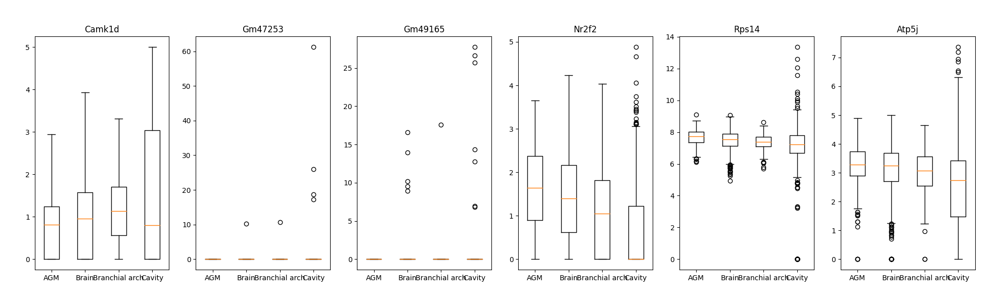

In [20]:
data.plt.boxplot_transit_gene(
                use_col='annotation',
                branch=['AGM', 'Brain', 'Branchial arch', 'Cavity'],
                genes=list(data.genes.to_df().sort_values('greater_pvalue').iloc[:3].index) + list(data.genes.to_df().sort_values('less_pvalue').iloc[:3].index)
                )

## Fuzzy'C means to cluster genes on spatial & temporal pattern

Except for up or down regulated genes, there is the other expression pattern also important. Stereopy considers both temporal and spatial information and based on which cluster genes into serveral groups.

In [21]:
data.tl.time_series_analysis(run_method='other', cluster_number=4)

[2024-04-07 17:50:19][Stereo][42395][MainThread][140284015499072][plot_collection][84][INFO]: register plot_func fuzz_cluster_plot to <stereo.plots.plot_collection.PlotCollection object at 0x7f960dbd6550>


Column
    [0] Markdown(str)
    [1] Row
        [0] TextInput(name='file name', placeholder='Enter a file name...', width=200)
        [1] Select(name='file format', options=['png', 'pdf'], value='png', width=60)
        [2] IntInput(name='dpi', placeholder='Enter the dip...', start=0, value=100, width=200)
    [2] Row
        [0] Button(button_type='primary', name='export', width=100)
        [1] StaticText(width=800)

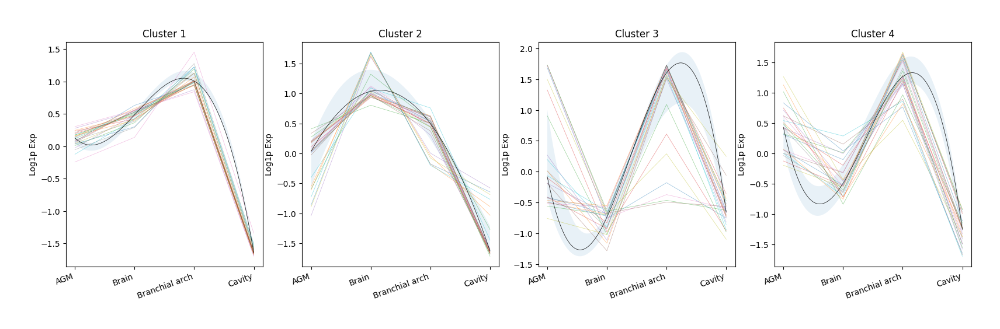

In [22]:
data.plt.fuzz_cluster_plot(
        use_col='annotation',
        branch=['AGM', 'Brain', 'Branchial arch', 'Cavity'], 
        threshold = 'p99.9',
        n_col = 4, 
        summary_trend=True, 
        width = None, 
        height = None
        )